# Import libraries

In [1]:
import os
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm

import seaborn as sns

from numpy.polynomial.polynomial import Polynomial

from scipy.signal import savgol_filter

from sklearn.preprocessing import MinMaxScaler

In [2]:
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 50)

In [3]:
path_to_save_data = './../data/preprocessed_data'
path_to_save = './../results/01_visualization'

# Loading & parsing data

In [4]:
path_to_ftir = './../data/raw_data'

*Collecting paths to subfolders in `path_to_ftir`*

In [5]:
division_folders = []

subfolder_names_lst = os.listdir(path_to_ftir)

for subfolder in subfolder_names_lst:
    isdir_flg = os.path.isdir(os.path.join(path_to_ftir, subfolder))
    startswith_division_flg = subfolder.startswith("division_")
    
    if isdir_flg and startswith_division_flg:
        path_to_subfolder = os.path.join(path_to_ftir, subfolder)
        division_folders.append(path_to_subfolder)

*Collecting paths to all file and sorting them*

In [6]:
files = []

for folder in division_folders:
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        
        if os.path.isfile(file_path) and filename.endswith(".dpt"):
            files.append(file_path)

In [7]:
files = sorted(
    files,
    key=lambda x: (
        os.path.basename(x).split("_")[0].replace(".", "").isnumeric(),
        float(os.path.basename(x).split("_")[0]) if os.path.basename(x).split("_")[0].replace(".", "").isnumeric() else os.path.basename(x)
    )
)

*Reading all files*

In [8]:
spectra_dict = {}
description_dict = {}

for file_path in files:
    filename = os.path.basename(file_path)
    folder_name = os.path.basename(os.path.dirname(file_path))
    fraction_name = filename.split("_")[0]

    try:
        tmp_df = pd.read_csv(file_path, sep=",", header=None)
        wavenumbers = tmp_df[0].values
        intensities = tmp_df[1].values

        key = f"{folder_name}_size_{fraction_name}"
        
        spectra_dict[key] = intensities
        description_dict[key] = [folder_name.split('_')[-1], fraction_name]

    except Exception as e:
        print(f"Ошибка при чтении {file_path}: {e}")

*Creating dataframes with spectral data and description of fractions*

In [9]:
initial_data = pd.DataFrame.from_dict(
    spectra_dict,
    orient="index",
    columns=wavenumbers
)

initial_data = initial_data.sort_index()

print(initial_data.shape)
initial_data.head(3)

(50, 3733)


,3998.31069,3997.34631,3996.38194,3995.41756,3994.45318,3993.48880,3992.52442,3991.56005,3990.59567,3989.63129,3988.66691,3987.70253,3986.73816,3985.77378,3984.80940,3983.84502,3982.88065,3981.91627,3980.95189,3979.98751,3979.02313,3978.05876,3977.09438,3976.13000,3975.16562,...,422.39751,421.43313,420.46876,419.50438,418.54000,417.57562,416.61124,415.64687,414.68249,413.71811,412.75373,411.78935,410.82498,409.86060,408.89622,407.93184,406.96747,406.00309,405.03871,404.07433,403.10995,402.14558,401.18120,400.21682,399.25244
division_1_size_0.2,-0.004680,-0.004680,-0.004680,-0.004680,-0.004680,-0.004680,-0.004680,-0.004759,-0.004761,-0.004728,-0.004698,-0.004768,-0.004841,-0.004810,-0.004749,-0.004735,-0.004760,-0.004766,-0.004759,-0.004691,-0.004591,-0.004546,-0.004537,-0.004547,-0.004562,...,0.001608,0.001597,0.001607,0.001590,0.001605,0.001655,0.001681,0.001585,0.001432,0.001343,0.001300,0.001247,0.001185,0.001200,0.001247,0.001274,0.001327,0.001404,0.001476,0.001476,0.001476,0.001476,0.001476,0.001476,0.001476
division_1_size_0.4,-0.005501,-0.005501,-0.005501,-0.005501,-0.005501,-0.005501,-0.005501,-0.005531,-0.005497,-0.005463,-0.005405,-0.005389,-0.005372,-0.005318,-0.005332,-0.005370,-0.005401,-0.005451,-0.005516,-0.005533,-0.005483,-0.005436,-0.005398,-0.005409,-0.005448,...,0.002596,0.002667,0.002730,0.002758,0.002767,0.002772,0.002722,0.002549,0.002376,0.002286,0.002247,0.002221,0.002201,0.002217,0.002208,0.002202,0.002247,0.002266,0.002238,0.002238,0.002238,0.002238,0.002238,0.002238,0.002238
division_1_size_2,-0.007410,-0.007410,-0.007410,-0.007410,-0.007410,-0.007410,-0.007410,-0.007394,-0.007328,-0.007283,-0.007182,-0.007056,-0.006948,-0.006829,-0.006797,-0.006846,-0.006897,-0.006949,-0.007021,-0.007071,-0.007071,-0.007097,-0.007130,-0.007118,-0.007107,...,0.002080,0.002184,0.002277,0.002288,0.002282,0.002304,0.002309,0.002238,0.002111,0.002019,0.001986,0.002018,0.002084,0.002115,0.002085,0.002036,0.001988,0.001919,0.001868,0.001868,0.001868,0.001868,0.001868,0.001868,0.001868


In [10]:
samples_description = pd.DataFrame.from_dict(
    description_dict,
    orient='index',
    columns=['Division', 'Size']
)

samples_description['Fraction'] = samples_description['Size'].apply(lambda x: f'$> 0$' if x.split('_')[-1] == 'bulk' else f'$< {x.split("_")[-1]}$')

samples_description = samples_description.sort_index()

print(samples_description.shape)
samples_description.head(3)

(50, 3)


,Division,Size,Fraction
division_1_size_0.2,1,0.2,$< 0.2$
division_1_size_0.4,1,0.4,$< 0.4$
division_1_size_2,1,2,$< 2$


# Data preprocessing

## Waverange selection

In [11]:
initial_data = initial_data.loc[:, (initial_data.columns >= 650) & (initial_data.columns <= 4000)]

## Baseline correction

In [12]:
data = initial_data.copy()

for idx in data.index:
    coefs = Polynomial.fit(data.columns, data.loc[idx], deg=2).convert().coef
    baseline = np.polyval(coefs[::-1], data.columns)
    
    corrected_intensity = data.loc[idx] - baseline
    corrected_intensity -= corrected_intensity.min()
    
    data.loc[idx] = corrected_intensity

print(data.shape)
data.head(3)

(50, 3472)


,3998.31069,3997.34631,3996.38194,3995.41756,3994.45318,3993.48880,3992.52442,3991.56005,3990.59567,3989.63129,3988.66691,3987.70253,3986.73816,3985.77378,3984.80940,3983.84502,3982.88065,3981.91627,3980.95189,3979.98751,3979.02313,3978.05876,3977.09438,3976.13000,3975.16562,...,674.10014,673.13576,672.17138,671.20700,670.24263,669.27825,668.31387,667.34949,666.38512,665.42074,664.45636,663.49198,662.52760,661.56323,660.59885,659.63447,658.67009,657.70571,656.74134,655.77696,654.81258,653.84820,652.88382,651.91945,650.95507
division_1_size_0.2,0.000849,0.000846,0.000842,0.000839,0.000836,0.000833,0.000829,0.000747,0.000741,0.000771,0.000798,0.000724,0.000649,0.000676,0.000734,0.000744,0.000716,0.000707,0.000711,0.000775,0.000873,0.000914,0.000920,0.000906,0.000888,...,0.000558,0.000556,0.000524,0.000500,0.000485,0.000463,0.000439,0.000433,0.000454,0.000465,0.000474,0.000530,0.000604,0.000619,0.000607,0.000634,0.000666,0.000656,0.000621,0.000601,0.000588,0.000547,0.000504,0.000490,0.000487
division_1_size_0.4,0.000749,0.000745,0.000741,0.000737,0.000733,0.000730,0.000726,0.000692,0.000721,0.000752,0.000806,0.000819,0.000832,0.000881,0.000864,0.000822,0.000787,0.000733,0.000664,0.000643,0.000690,0.000733,0.000767,0.000752,0.000710,...,0.001080,0.001183,0.001457,0.001707,0.001897,0.002018,0.002048,0.002011,0.001936,0.001805,0.001608,0.001380,0.001210,0.001229,0.001317,0.001341,0.001340,0.001311,0.001265,0.001234,0.001232,0.001259,0.001280,0.001287,0.001279
division_1_size_2,0.000149,0.000144,0.000140,0.000135,0.000130,0.000125,0.000121,0.000132,0.000193,0.000234,0.000330,0.000452,0.000554,0.000668,0.000696,0.000642,0.000586,0.000529,0.000453,0.000398,0.000393,0.000362,0.000325,0.000332,0.000339,...,0.000931,0.000996,0.001185,0.001377,0.001536,0.001624,0.001655,0.001646,0.001586,0.001481,0.001315,0.001111,0.000979,0.001006,0.001087,0.001114,0.001118,0.001133,0.001155,0.001152,0.001134,0.001132,0.001131,0.001138,0.001150


## Smoothing

In [13]:
data_smoothed = data.copy()

for idx in data_smoothed.index:
    data_smoothed.loc[idx] = savgol_filter(data_smoothed.loc[idx], window_length=93, polyorder=3)

print(data_smoothed.shape)
data_smoothed.head(3)

(50, 3472)


,3998.31069,3997.34631,3996.38194,3995.41756,3994.45318,3993.48880,3992.52442,3991.56005,3990.59567,3989.63129,3988.66691,3987.70253,3986.73816,3985.77378,3984.80940,3983.84502,3982.88065,3981.91627,3980.95189,3979.98751,3979.02313,3978.05876,3977.09438,3976.13000,3975.16562,...,674.10014,673.13576,672.17138,671.20700,670.24263,669.27825,668.31387,667.34949,666.38512,665.42074,664.45636,663.49198,662.52760,661.56323,660.59885,659.63447,658.67009,657.70571,656.74134,655.77696,654.81258,653.84820,652.88382,651.91945,650.95507
division_1_size_0.2,0.000811,0.000811,0.000811,0.000811,0.000811,0.000811,0.000811,0.000810,0.000810,0.000809,0.000809,0.000808,0.000807,0.000806,0.000805,0.000804,0.000803,0.000802,0.000801,0.000800,0.000799,0.000798,0.000796,0.000795,0.000794,...,0.000538,0.000535,0.000532,0.000529,0.000527,0.000525,0.000524,0.000523,0.000523,0.000523,0.000524,0.000525,0.000527,0.000530,0.000533,0.000537,0.000542,0.000547,0.000553,0.000560,0.000567,0.000575,0.000584,0.000594,0.000605
division_1_size_0.4,0.000727,0.000731,0.000734,0.000737,0.000740,0.000744,0.000747,0.000750,0.000752,0.000755,0.000758,0.000761,0.000763,0.000766,0.000769,0.000771,0.000773,0.000776,0.000778,0.000780,0.000782,0.000784,0.000786,0.000788,0.000790,...,0.001377,0.001380,0.001383,0.001386,0.001388,0.001390,0.001391,0.001393,0.001394,0.001395,0.001395,0.001395,0.001395,0.001394,0.001394,0.001392,0.001391,0.001389,0.001386,0.001384,0.001381,0.001377,0.001373,0.001369,0.001364
division_1_size_2,0.000116,0.000140,0.000164,0.000186,0.000207,0.000228,0.000247,0.000266,0.000284,0.000301,0.000318,0.000333,0.000348,0.000362,0.000375,0.000388,0.000400,0.000411,0.000422,0.000432,0.000441,0.000450,0.000458,0.000466,0.000473,...,0.001151,0.001152,0.001153,0.001154,0.001156,0.001158,0.001159,0.001161,0.001164,0.001166,0.001169,0.001172,0.001176,0.001179,0.001183,0.001188,0.001192,0.001197,0.001202,0.001208,0.001214,0.001220,0.001227,0.001234,0.001241


## Wavenumber range selection

### Fingerprint region (*fpr*)

In [14]:
data_smoothed_fpr = data_smoothed.loc[:, (data_smoothed.columns >= 800) & (data_smoothed.columns <= 1900)]

print(data_smoothed_fpr.shape)
data_smoothed_fpr.head(3)

(50, 1141)


,1899.82442,1898.86005,1897.89567,1896.93129,1895.96691,1895.00253,1894.03816,1893.07378,1892.10940,1891.14502,1890.18065,1889.21627,1888.25189,1887.28751,1886.32313,1885.35876,1884.39438,1883.43000,1882.46562,1881.50124,1880.53687,1879.57249,1878.60811,1877.64373,1876.67935,...,823.57871,822.61433,821.64995,820.68558,819.72120,818.75682,817.79244,816.82806,815.86369,814.89931,813.93493,812.97055,812.00618,811.04180,810.07742,809.11304,808.14866,807.18429,806.21991,805.25553,804.29115,803.32677,802.36240,801.39802,800.43364
division_1_size_0.2,0.000043,0.000041,0.000040,0.000038,0.000036,0.000035,0.000035,0.000035,0.000035,0.000035,0.000035,0.000035,0.000036,0.000037,0.000038,0.000039,0.000040,0.000041,0.000043,0.000044,0.000046,0.000047,0.000049,0.000052,0.000056,...,0.000563,0.000563,0.000564,0.000564,0.000562,0.000558,0.000553,0.000547,0.000541,0.000535,0.000530,0.000526,0.000524,0.000522,0.000521,0.000520,0.000519,0.000516,0.000514,0.000512,0.000511,0.000511,0.000513,0.000515,0.000517
division_1_size_0.4,0.000064,0.000067,0.000069,0.000072,0.000074,0.000076,0.000079,0.000081,0.000083,0.000084,0.000084,0.000084,0.000083,0.000083,0.000082,0.000083,0.000085,0.000087,0.000090,0.000094,0.000098,0.000102,0.000106,0.000109,0.000113,...,0.000765,0.000768,0.000772,0.000777,0.000779,0.000780,0.000779,0.000777,0.000774,0.000771,0.000769,0.000767,0.000767,0.000767,0.000768,0.000768,0.000768,0.000769,0.000769,0.000768,0.000768,0.000769,0.000770,0.000771,0.000771
division_1_size_2,0.000372,0.000379,0.000384,0.000387,0.000388,0.000387,0.000385,0.000383,0.000380,0.000377,0.000375,0.000374,0.000375,0.000375,0.000375,0.000374,0.000373,0.000371,0.000369,0.000368,0.000367,0.000366,0.000367,0.000367,0.000368,...,0.000810,0.000810,0.000811,0.000814,0.000817,0.000819,0.000821,0.000822,0.000823,0.000824,0.000824,0.000823,0.000823,0.000824,0.000825,0.000826,0.000826,0.000825,0.000823,0.000822,0.000823,0.000825,0.000827,0.000829,0.000831


### High wavenumbers region (*hwr*)

In [15]:
data_smoothed_hwr = data_smoothed.loc[:, (data_smoothed.columns >= 2200) & (data_smoothed.columns <= 3800)]

print(data_smoothed_hwr.shape)
data_smoothed_hwr.head(3)

(50, 1659)


,3799.64885,3798.68447,3797.72009,3796.75571,3795.79134,3794.82696,3793.86258,3792.89820,3791.93382,3790.96945,3790.00507,3789.04069,3788.07631,3787.11194,3786.14756,3785.18318,3784.21880,3783.25442,3782.29005,3781.32567,3780.36129,3779.39691,3778.43253,3777.46816,3776.50378,...,2223.85539,2222.89101,2221.92664,2220.96226,2219.99788,2219.03350,2218.06912,2217.10475,2216.14037,2215.17599,2214.21161,2213.24724,2212.28286,2211.31848,2210.35410,2209.38972,2208.42535,2207.46097,2206.49659,2205.53221,2204.56783,2203.60346,2202.63908,2201.67470,2200.71032
division_1_size_0.2,0.000835,0.000824,0.000812,0.000801,0.000790,0.000782,0.000775,0.000771,0.000769,0.000770,0.000772,0.000775,0.000780,0.000785,0.000789,0.000792,0.000794,0.000796,0.000797,0.000798,0.000798,0.000800,0.000805,0.000812,0.000821,...,0.000482,0.000480,0.000479,0.000478,0.000476,0.000475,0.000473,0.000472,0.000471,0.000469,0.000468,0.000466,0.000465,0.000463,0.000462,0.000461,0.000459,0.000458,0.000456,0.000455,0.000454,0.000452,0.000451,0.000449,0.000448
division_1_size_0.4,0.000880,0.000865,0.000850,0.000836,0.000824,0.000815,0.000807,0.000799,0.000795,0.000795,0.000797,0.000802,0.000808,0.000814,0.000817,0.000819,0.000820,0.000819,0.000816,0.000813,0.000812,0.000814,0.000821,0.000834,0.000849,...,0.000726,0.000724,0.000722,0.000720,0.000717,0.000715,0.000713,0.000711,0.000709,0.000707,0.000705,0.000703,0.000701,0.000699,0.000697,0.000695,0.000693,0.000691,0.000689,0.000687,0.000684,0.000682,0.000680,0.000678,0.000676
division_1_size_2,0.000785,0.000768,0.000751,0.000734,0.000720,0.000710,0.000702,0.000695,0.000690,0.000687,0.000685,0.000684,0.000686,0.000689,0.000691,0.000695,0.000699,0.000703,0.000705,0.000706,0.000706,0.000707,0.000709,0.000712,0.000717,...,0.000602,0.000601,0.000600,0.000599,0.000598,0.000597,0.000596,0.000595,0.000594,0.000593,0.000592,0.000591,0.000591,0.000590,0.000589,0.000588,0.000587,0.000586,0.000585,0.000584,0.000583,0.000582,0.000582,0.000581,0.000580


## Scaling to range [0...1]

In [16]:
data_scaled_fpr = data_smoothed_fpr.copy()

scaler = MinMaxScaler()

data_scaled_fpr.iloc[:, :] = scaler.fit_transform(data_scaled_fpr.T).T

print(data_scaled_fpr.shape)
data_scaled_fpr.head(3)

(50, 1141)


,1899.82442,1898.86005,1897.89567,1896.93129,1895.96691,1895.00253,1894.03816,1893.07378,1892.10940,1891.14502,1890.18065,1889.21627,1888.25189,1887.28751,1886.32313,1885.35876,1884.39438,1883.43000,1882.46562,1881.50124,1880.53687,1879.57249,1878.60811,1877.64373,1876.67935,...,823.57871,822.61433,821.64995,820.68558,819.72120,818.75682,817.79244,816.82806,815.86369,814.89931,813.93493,812.97055,812.00618,811.04180,810.07742,809.11304,808.14866,807.18429,806.21991,805.25553,804.29115,803.32677,802.36240,801.39802,800.43364
division_1_size_0.2,0.002636,0.002261,0.001838,0.001222,0.000488,0.000025,0.000000,0.000113,0.000227,0.000234,0.000136,0.000185,0.000389,0.000732,0.001114,0.001420,0.001733,0.002140,0.002628,0.003084,0.003622,0.004236,0.004878,0.005794,0.007082,...,0.174818,0.174954,0.175071,0.175045,0.174512,0.173299,0.171585,0.169603,0.167578,0.165608,0.163860,0.162594,0.161855,0.161349,0.160944,0.160619,0.160117,0.159437,0.158735,0.158047,0.157600,0.157680,0.158218,0.158915,0.159447
division_1_size_0.4,0.000000,0.000786,0.001551,0.002163,0.002726,0.003440,0.004261,0.004885,0.005332,0.005619,0.005666,0.005594,0.005428,0.005179,0.005060,0.005279,0.005763,0.006431,0.007334,0.008383,0.009520,0.010608,0.011569,0.012589,0.013730,...,0.193577,0.194451,0.195660,0.196846,0.197658,0.197901,0.197583,0.196863,0.196052,0.195339,0.194746,0.194317,0.194178,0.194292,0.194476,0.194609,0.194625,0.194635,0.194657,0.194602,0.194600,0.194786,0.195064,0.195244,0.195255
division_1_size_2,0.004366,0.007183,0.009411,0.010861,0.011305,0.010962,0.010196,0.009053,0.007726,0.006434,0.005487,0.005243,0.005458,0.005560,0.005402,0.005061,0.004461,0.003770,0.003066,0.002312,0.001839,0.001680,0.001765,0.002146,0.002505,...,0.201819,0.201680,0.202095,0.203218,0.204628,0.205856,0.206636,0.207074,0.207536,0.207880,0.207891,0.207637,0.207534,0.207801,0.208402,0.208980,0.208892,0.208312,0.207583,0.207146,0.207476,0.208256,0.209123,0.209950,0.210914


In [17]:
data_scaled_hwr = data_smoothed_hwr.copy()

scaler = MinMaxScaler()

data_scaled_hwr.iloc[:, :] = scaler.fit_transform(data_scaled_hwr.T).T

print(data_scaled_hwr.shape)
data_scaled_hwr.head(3)

(50, 1659)


,3799.64885,3798.68447,3797.72009,3796.75571,3795.79134,3794.82696,3793.86258,3792.89820,3791.93382,3790.96945,3790.00507,3789.04069,3788.07631,3787.11194,3786.14756,3785.18318,3784.21880,3783.25442,3782.29005,3781.32567,3780.36129,3779.39691,3778.43253,3777.46816,3776.50378,...,2223.85539,2222.89101,2221.92664,2220.96226,2219.99788,2219.03350,2218.06912,2217.10475,2216.14037,2215.17599,2214.21161,2213.24724,2212.28286,2211.31848,2210.35410,2209.38972,2208.42535,2207.46097,2206.49659,2205.53221,2204.56783,2203.60346,2202.63908,2201.67470,2200.71032
division_1_size_0.2,0.095751,0.093167,0.090435,0.087680,0.085218,0.083331,0.081756,0.080634,0.080337,0.080564,0.080924,0.081604,0.082747,0.083915,0.084898,0.085617,0.086062,0.086530,0.086902,0.087011,0.087109,0.087548,0.088615,0.090358,0.092402,...,0.013042,0.012709,0.012378,0.012046,0.011714,0.011383,0.011052,0.010722,0.010391,0.010061,0.009730,0.009400,0.009070,0.008741,0.008411,0.008082,0.007753,0.007424,0.007095,0.006767,0.006438,0.006110,0.005782,0.005455,0.005127
division_1_size_0.4,0.124264,0.118820,0.113071,0.107492,0.102986,0.099537,0.096445,0.093676,0.092110,0.091967,0.092751,0.094550,0.096975,0.099074,0.100432,0.101223,0.101440,0.100937,0.099904,0.098836,0.098517,0.099379,0.101972,0.106676,0.112597,...,0.065499,0.064707,0.063915,0.063124,0.062333,0.061543,0.060753,0.059964,0.059174,0.058386,0.057597,0.056809,0.056022,0.055235,0.054448,0.053661,0.052876,0.052090,0.051305,0.050520,0.049735,0.048951,0.048168,0.047384,0.046602
division_1_size_2,0.090345,0.083318,0.075831,0.068632,0.062911,0.058639,0.054937,0.051852,0.049886,0.048773,0.047795,0.047464,0.048230,0.049269,0.050448,0.051955,0.053617,0.055269,0.056337,0.056736,0.056904,0.057098,0.057848,0.059468,0.061509,...,0.012050,0.011656,0.011263,0.010870,0.010479,0.010087,0.009697,0.009306,0.008917,0.008528,0.008139,0.007751,0.007364,0.006977,0.006591,0.006206,0.005821,0.005436,0.005052,0.004669,0.004286,0.003904,0.003523,0.003142,0.002761


# Data visualization

## Base variables

In [18]:
divisions_lst = sorted(samples_description['Division'].unique())
print(divisions_lst)

['1', '2', '5', '6', '7', '8', '9']


In [19]:
X_LABEL_FONT_SIZE = 14
Y_LABEL_FONT_SIZE = 14

X_TICK_FONT_SIZE = 12
Y_TICK_FONT_SIZE = 12

LEGEND_TITLE_FONT_SIZE = 12
LEGEND_FONT_SIZE = 12

TITLE_FONT_SIZE = 16

In [20]:
sns.set_theme()

## Function for data visualization

In [21]:
def plot_spectra(data_vis, figsize=(10, 4), y_labelpad=5, x_nbins=12, y_nbins=12, x_step=None, y_step=None, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, dpi=300)

    fractions_sorted = sorted(data_vis.index, key=lambda x: float(x.split('_')[-1].replace('bulk', '1000')), reverse=True)
    colors = cm.bwr(np.linspace(0.2, 1.0, len(fractions_sorted)))

    for color, fraction in zip(colors, fractions_sorted):
        label = f'$> 0$' if fraction.split('_')[-1] == 'bulk' else f'$< {fraction.split("_")[-1]}$'

        ax.plot(
            data_vis.columns,
            data_vis.loc[fraction],
            label=label,
            alpha=0.8,
            color=color,
            linewidth=2.5
        )

    if x_step is None:
        ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=x_nbins))
    else:
        ax.xaxis.set_major_locator(ticker.MultipleLocator(x_step))
    
    if y_step is None:
        ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=y_nbins))
    else:
        ax.yaxis.set_major_locator(ticker.MultipleLocator(y_step))

    ax.set_ylabel('$A$', fontsize=Y_LABEL_FONT_SIZE, labelpad=y_labelpad, rotation=0)
    ax.set_xlabel('Волновое число, см$^{-1}$', fontsize=X_LABEL_FONT_SIZE)

    ax.tick_params(axis='x', labelsize=X_TICK_FONT_SIZE)
    ax.tick_params(axis='y', labelsize=Y_TICK_FONT_SIZE)

    ax.invert_xaxis()

    ax.legend(title='Тип размерной фракции, мкм', fontsize=LEGEND_FONT_SIZE, loc='best', ncol=3)

    ax.grid(True)

    if ax is None:
        plt.tight_layout()
        plt.show()


## FTIR-spectra (*raw & baseline correted & smoothed*) in region 4000-400 cm$^{-1}$ (*ar*)

### All divisions at one figure

In [22]:
fig, axes = plt.subplots(nrows=7, ncols=3, figsize=(18, 7 * 4.5), dpi=300)

for i, division in enumerate(divisions_lst):
    # Selecting index for current division
    idx_lst = samples_description.loc[samples_description['Division'] == division].index

    # Selecting parts of data by index
    initial_data_vis = initial_data.loc[idx_lst]
    data_vis = data.loc[idx_lst]
    data_smoothed_vis = data_smoothed.loc[idx_lst]

    plot_spectra(data_vis=initial_data_vis, y_labelpad=10, ax=axes[i][0])
    plot_spectra(data_vis=data_vis, y_labelpad=10, ax=axes[i][1])
    plot_spectra(data_vis=data_smoothed_vis, y_labelpad=10, ax=axes[i][2])

    # Creating annotation
    axes[i, 0].annotate(
        text=f'$DivID = {division}$',
        xy=(0.013, 0.98),
        xycoords='axes fraction',
        fontsize=TITLE_FONT_SIZE-4,
        fontweight='bold',
        color='black',
        ha='left',
        va='top',
        bbox={
            'facecolor': 'white',
            'edgecolor': 'black',
            'boxstyle': 'round',
            'alpha': 0.5
        }
    )

    # Creating titles and labels of X, Y axes
    if i == 0:
        axes[i][0].set_title('(A) Исходные ИК-спектры', fontsize=TITLE_FONT_SIZE, fontweight='bold')
        axes[i][1].set_title('(B) ИК-спектры после коррекции базовой линии', fontsize=TITLE_FONT_SIZE, fontweight='bold')
        axes[i][2].set_title('(C) Сглаженные ИК-спектры', fontsize=TITLE_FONT_SIZE, fontweight='bold')

plt.tight_layout()

# plt.savefig(f'{path_to_save}/ar_raw_bc_smoothed_spectra.png', dpi=600)

plt.show()

### *Division №7* at one figure

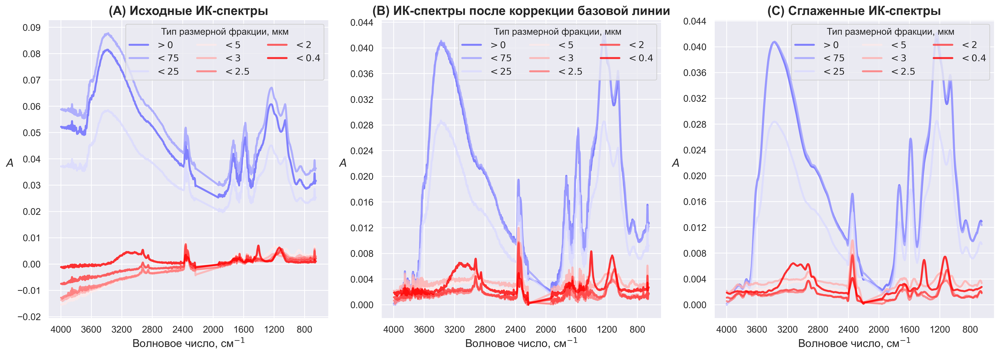

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6.5), dpi=300)

for division in ['7']:
    idx_lst = samples_description.loc[samples_description['Division'] == division].index
    
    initial_data_vis = initial_data.loc[idx_lst]
    data_vis = data.loc[idx_lst]
    data_smoothed_vis = data_smoothed.loc[idx_lst]
    
    axes[0].set_title('(A) Исходные ИК-спектры', fontsize=TITLE_FONT_SIZE, fontweight='bold')
    plot_spectra(data_vis=initial_data_vis, y_labelpad=10, ax=axes[0])
    
    axes[1].set_title('(B) ИК-спектры после коррекции базовой линии', fontsize=TITLE_FONT_SIZE, fontweight='bold')
    plot_spectra(data_vis=data_vis, y_labelpad=10, ax=axes[1])
    
    axes[2].set_title('(C) Сглаженные ИК-спектры', fontsize=TITLE_FONT_SIZE, fontweight='bold')
    plot_spectra(data_vis=data_smoothed_vis, y_labelpad=10, ax=axes[2])

plt.tight_layout()

plt.savefig(f'{path_to_save}/ar_raw_bc_smoothed_spectra.png', dpi=600)

plt.show()

## Merged subplots of preprocessed spectra in region 3800-2200 cm$^{-1}$ (*hwr*)

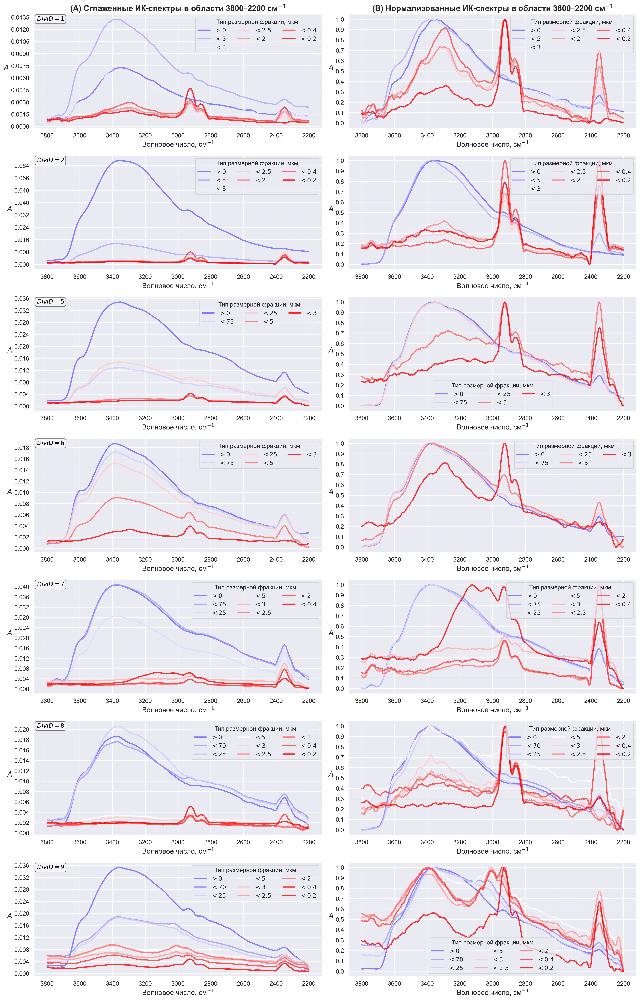

In [24]:
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(18, 7 * 4.0), dpi=300)

for i, division in enumerate(divisions_lst):
    # Selecting index for current division
    idx_lst = samples_description.loc[samples_description['Division'] == division].index

    # Selecting parts of data by index
    data_smoothed_hwr_vis = data_smoothed_hwr.loc[idx_lst]
    data_scaled_hwr_vis = data_scaled_hwr.loc[idx_lst]
    
    plot_spectra(data_vis=data_smoothed_hwr_vis, y_labelpad=10, x_nbins=10, ax=axes[i][0])    
    plot_spectra(data_vis=data_scaled_hwr_vis, y_labelpad=10, x_nbins=10, ax=axes[i][1])

    # Creating annotation
    axes[i, 0].annotate(
        text=f'$DivID = {division}$',
        xy=(0.01, 0.98),
        xycoords='axes fraction',
        fontsize=TITLE_FONT_SIZE-4,
        fontweight='bold',
        color='black',
        ha='left',
        va='top',
        bbox={
            'facecolor': 'white',
            'edgecolor': 'black',
            'boxstyle': 'round',
            'alpha': 0.5
        }
    )

    # Creating titles and labels of X, Y axes
    if i == 0:
        axes[i][0].set_title('(A) Сглаженные ИК-спектры в области 3800–2200 см$^{-1}$', fontsize=TITLE_FONT_SIZE, fontweight='bold')
        axes[i][1].set_title('(B) Нормализованные ИК-спектры в области 3800–2200 см$^{-1}$', fontsize=TITLE_FONT_SIZE, fontweight='bold')

    # Correction of legend location
    legend_x = axes[i][0].get_legend().get_window_extent().x0
    x_rel = legend_x / (fig.get_size_inches()[0] * fig.dpi)
    
    if x_rel < 0.5:
        legend_title = axes[i][0].get_legend().get_title().get_text()
        axes[i][0].legend(loc='upper right', title=legend_title, fontsize=LEGEND_FONT_SIZE, ncols=3)

plt.tight_layout()

# plt.savefig(f'{path_to_save}/ar_raw_bc_smoothed_spectra.png', dpi=600)

plt.show()

## Merged subplots of preprocessed spectra in region 1900-800 cm$^{-1}$ (*fpr*)

In [25]:
axes[i][0].get_legend().get_window_extent()

Bbox([[1627.7099609375, 849.9474751003349], [2689.8125, 1148.947475100335]])

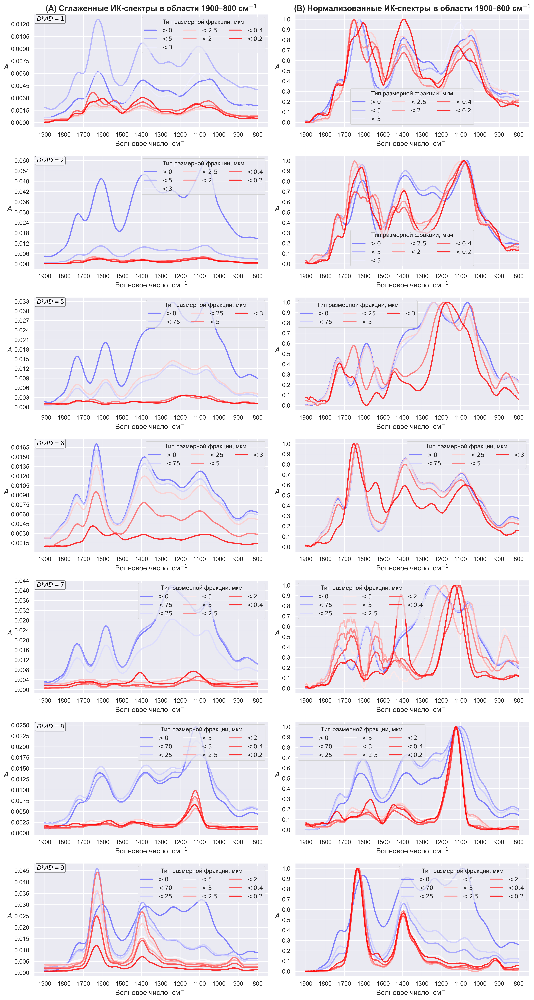

In [26]:
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 7 * 4.0), dpi=300)

for i, division in enumerate(divisions_lst):
    idx_lst = samples_description.loc[samples_description['Division'] == division].index
    
    data_smoothed_fpr_vis = data_smoothed_fpr.loc[idx_lst]
    data_scaled_fpr_vis = data_scaled_fpr.loc[idx_lst]

    # Creating annotation
    axes[i, 0].annotate(
        text=f'$DivID = {division}$',
        xy=(0.011, 0.98),
        xycoords='axes fraction',
        fontsize=TITLE_FONT_SIZE-4,
        fontweight='bold',
        color='black',
        ha='left',
        va='top',
        bbox={
            'facecolor': 'white',
            'edgecolor': 'black',
            'boxstyle': 'round',
            'alpha': 0.5
        }
    )

    plot_spectra(data_vis=data_smoothed_fpr_vis, y_labelpad=10, x_step=100, ax=axes[i][0])    
    plot_spectra(data_vis=data_scaled_fpr_vis, y_labelpad=10, x_step=100, ax=axes[i][1])

    # Creating titles and labels of X, Y axes
    if i == 0:
        axes[i][0].set_title('(A) Сглаженные ИК-спектры в области 1900–800 см$^{-1}$', fontsize=TITLE_FONT_SIZE, fontweight='bold')
        axes[i][1].set_title('(B) Нормализованные ИК-спектры в области 1900–800 см$^{-1}$', fontsize=TITLE_FONT_SIZE, fontweight='bold')

    # Correction of legend location
    legend_x = axes[i][0].get_legend().get_window_extent().x0
    x_rel = legend_x / (fig.get_size_inches()[0] * fig.dpi)
    
    if x_rel < 0.5:
        legend_title = axes[i][0].get_legend().get_title().get_text()
        axes[i][0].legend(loc='upper right', title=legend_title, fontsize=LEGEND_FONT_SIZE, ncols=3)

plt.tight_layout()

# plt.savefig(f'{path_to_save}/fpr_smoothed_scaled_spectra.png', dpi=600)

plt.show()

# Saving data

In [27]:
path_to_save = './../data/preprocessed_data'

In [28]:
data_scaled_hwr.to_csv(f'{path_to_save}/ftir_scaled_hwr.csv', sep=';')
data_scaled_hwr.T.to_csv(f'{path_to_save}/ftir_scaled_transposed_hwr.csv', sep=';')

In [29]:
data_scaled_fpr.to_csv(f'{path_to_save}/ftir_scaled_fpr.csv', sep=';')
data_scaled_fpr.T.to_csv(f'{path_to_save}/ftir_scaled_transposed_fpr.csv', sep=';')